In [5]:
# Pytorch imports
import torch
from torch import nn 
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from torchvision import models
from torchvision.transforms import v2
import torch.nn.functional as F
from torchvision.io import read_image
import torchvision
import matplotlib

# Other imports
import numpy as np 
import matplotlib.pyplot as plt
from tqdm import tqdm
import tqdm
import os
import json
import PIL
import random
import segmentation_models_pytorch as smp

# Custom imports
from utils import create_class_map, random_image_and_mask, predict_and_plot

In [6]:
print("Pytorch version: ", torch.__version__)
print("Segmentation Models Pytorch version: ", smp.__version__)
print("Pillow version: ", PIL.__version__)
print("Numpy version: ", np.__version__)
print("matplotlib version: ", matplotlib.__version__)
print("Torchvision version: ", torchvision.__version__)
print("Tqdm version: ", tqdm.__version__)

Pytorch version:  2.1.2
Segmentation Models Pytorch version:  0.3.3
Pillow version:  10.0.1
Numpy version:  1.26.3
matplotlib version:  3.8.0
Torchvision version:  0.16.2
Tqdm version:  4.65.0


## Prelimenary Data Processing and Pre-Checks
___

* Create the class map variables from our utils files 

* Check the distribution for the image sizes

* Check the GPU status

In [3]:
# Show what the classes label represent
class_map = create_class_map()
class_map

{'0': 'Background',
 '1': 'Property Roof',
 '2': 'Secondary Structure',
 '3': 'Swimming Pool',
 '4': 'Vehicle',
 '5': 'Grass',
 '6': 'Trees / Shrubs',
 '7': 'Solar Panels',
 '8': 'Chimney',
 '9': 'Street Light',
 '10': 'Window',
 '11': 'Satellite Antenna',
 '12': 'Garbage Bins',
 '13': 'Trampoline',
 '14': 'Road/Highway',
 '15': 'Under Construction / In Progress Status',
 '16': 'Power Lines & Cables',
 '17': 'Water Tank / Oil Tank',
 '18': 'Parking Area - Commercial',
 '19': 'Sports Complex / Arena',
 '20': 'Industrial Site',
 '21': 'Dense Vegetation / Forest',
 '22': 'Water Body',
 '23': 'Flooded',
 '24': 'Boat'}

In [4]:
# Check image sizes 
def check_image_sizes(dir):
    print(dir)
    image_sizes = {}
    for image_name in os.listdir(dir):
        image = PIL.Image.open(f'{dir}/{image_name}')
        image_size = image.size
        if image_size not in image_sizes:
            image_sizes[image_size] = 0
            image_sizes[image_size] += 1
        else:
            image_sizes[image_size] += 1
    print(image_sizes)

# Check image sizes for all image and mask 
for dir in ['data/train/train_images', 'data/test/test_images', 'data/train/train_masks', 'data/test/test_masks']:
    check_image_sizes(dir)

data/train/train_images
{(3000, 4000): 153, (3072, 4592): 56}
data/test/test_images
{(3000, 4000): 34, (3072, 4592): 18}
data/train/train_masks
{(3000, 4000): 153, (3072, 4592): 56}
data/test/test_masks
{(3000, 4000): 34, (3072, 4592): 18}


In [5]:
assert torch.cuda.is_available(), 'CUDA not available'
!nvidia-smi

Mon Apr 29 15:53:21 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.12                 Driver Version: 546.12       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce GTX 1660 Ti   WDDM  | 00000000:01:00.0  On |                  N/A |
| N/A   56C    P8               8W /  80W |    153MiB /  6144MiB |      6%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Create the Pytorch Dataset Class
___

* Create the dataset class for our train and test sets from the images stored on the local machine

* Edit the __getitem__ and __len__ methods

* Create a function that will apply different data augmentations to our images to increase our training set

In [5]:
# Creating the dataset class needed to test on the pytorch models
# We will be leveraging the torchvision.transforms module to do data augmentation 
class SemanticSegmentationDataset(Dataset):

    def __init__(self, root='data', train=True):
        super(SemanticSegmentationDataset, self).__init__()

        # Setting up the root directory
        self.root = os.path.join(root, 'train' if train else 'test')
        self.images_path = os.path.join(self.root, 'train_images' if train else 'test_images')
        self.masks_path = os.path.join(self.root, 'train_masks' if train else 'test_masks')
        self.train = train

        # Getting the images and masks
        self.images = os.listdir(self.images_path)
        self.masks = os.listdir(self.masks_path)
        assert len(self.images) == len(self.masks) 

    def __len__(self):
        # Returning the length of the dataset
        return len(self.images)
    
    def __getitem__(self, idx):
        # Getting the image and the ground truth mask
        image = read_image(os.path.join(self.images_path, self.images[idx]))
        mask = read_image(os.path.join(self.masks_path, self.masks[idx]))
        if self.train:
            image, mask = self.transformation(image, mask)
        else:
            image = v2.Resize((512,512), antialias=True)(image)
            mask = v2.Resize((512,512), antialias=True)(mask)
        
        return image, mask
    
    def transformation(self, image, mask):
        # Creating a separate transformation function so that we can properly apply
        # the same transformation to both the image and the mask
        # Or apply different transformations to the image and the mask such as colorjitter for the image
        # But not the mask
        # Resize the image and mask to 512x512
        resize = v2.Resize((512,512), antialias=True)
        image = resize(image)
        mask = resize(mask)

        # 50% chance to flip the image and mask horizontally
        rand1 = random.random()
        if rand1 > 0.5:
            h_flip = v2.RandomHorizontalFlip(p=1)
            image = h_flip(image)
            mask = h_flip(mask)

        # 50% chance to flip the image and mask vertically
        rand2 = random.random()
        if rand2 > 0.5:
            v_flip = v2.RandomVerticalFlip(p=1)
            image = v_flip(image)
            mask = v_flip(mask)

        # 70% chance to rotate the image and mask by 90 degrees
        rand3 = random.random()
        if rand3 > 0.3:
            rotate = v2.RandomRotation(degrees=[0,180])
            seed = np.random.randint(0, 100000)
            torch.manual_seed(seed)
            image = rotate(image)
            torch.manual_seed(seed)
            mask = rotate(mask)

        image = v2.ColorJitter(brightness=[0.7,1.3])(image)
            
        return image, mask


## Example of what ColorJitters Brightness Parameter Will do to the Training Images
___

* Create a grid showing the effect of the brightness on training images from values of 0.5-1.5

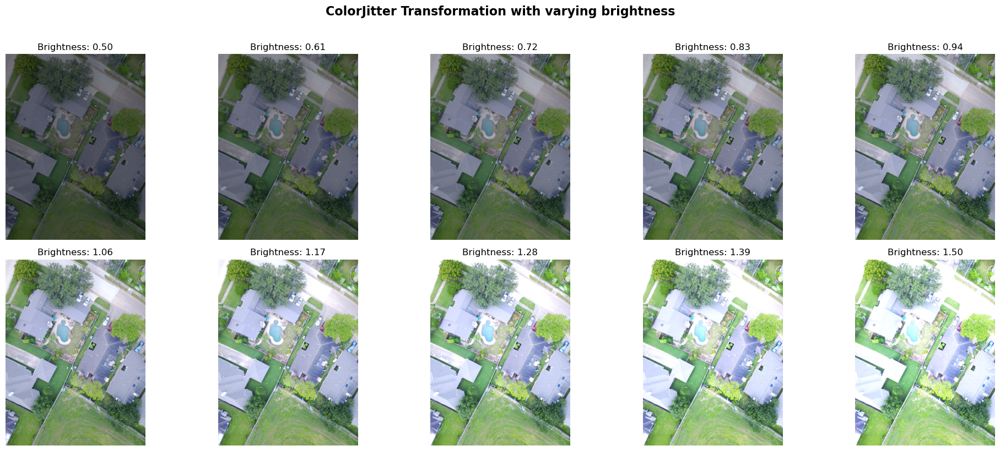

In [7]:
image_path = "data/train/train_images/6411.jpg"
image = PIL.Image.open(image_path)

# Define brightness values to iterate over
brightness_values = torch.linspace(0.5, 1.5, steps=10)  # Generate 10 brightness values from 0.5 to 1.5

# Define ColorJitter transformation with only brightness adjustment
color_jitter = transforms.ColorJitter(brightness=(0, 0))  # We'll set brightness dynamically in the loop

# Plot the transformed images in a 2x5 grid
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle("ColorJitter Transformation with varying brightness", fontsize=16, y=1.02, fontweight='bold')
for i, brightness in enumerate(brightness_values):
    # Set brightness value for the ColorJitter transformation
    color_jitter.brightness = (brightness.item(), brightness.item())
    
    # Apply the ColorJitter transformation to the image
    transformed_image = color_jitter(image)
    
    # Plot the transformed image
    row = i // 5
    col = i % 5
    axes[row, col].imshow(transformed_image)
    axes[row, col].axis('off')
    axes[row, col].set_title(f"Brightness: {brightness:.2f}")

plt.tight_layout()
plt.show()

In [21]:
BATCH_SIZE = 1
# Create the train and test datasets
train_dataset = SemanticSegmentationDataset(root='data', train=True)
test_dataset = SemanticSegmentationDataset(root='data', train=False)

# Create the train and test dataloaders
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [9]:
def pixel_wise_accuracy(pred, target):
    # Getting the accuracy of the model
    pred = torch.argmax(pred, dim=1)
    correct = torch.sum(pred == target)
    total = target.shape[0] * target.shape[1] * target.shape[2]
    return correct / total

def multiclass_iou(pred, target):
    # Getting the intersection over union
    pred = torch.argmax(pred, dim=1).cpu().numpy()
    target = target.cpu().numpy()
    intersect = np.sum(pred*target)
    union = np.sum(pred) + np.sum(target) - intersect
    iou = np.mean(intersect/union)
    return round(iou, 3), intersect, union


In [10]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()

In [ ]:
def multiclass_accuracy(prediction, ground_truth, num_classes=25):
    # TODO: Implement the multiclass accuracy function
    # Getting the pixelwise accuracy
    total_num_pixels = prediction.shape[0] * prediction.shape[1] * prediction.shape[2]

In [30]:
def multiclass_iou(prediction, ground_truth, num_classes=25):
    # TODO incorporate batch_size
    """
    Function to calculate the intersection over union for each class and the image as a whole

    Args:
    prediction: The model's prediction
    ground_truth: The ground truth mask
    num_classes: The number of classes in the dataset
    """

    # Check to see if the prediction and ground truth are tensors
    if type(prediction) == torch.Tensor:
        prediction = prediction.argmax(dim=1).cpu().numpy().astype(np.uint8)
    else:
        prediction = prediction.astype(np.uint8)
    if type(ground_truth) == torch.Tensor:
        ground_truth = ground_truth.cpu().numpy().astype(np.uint8)
    else:
        ground_truth = ground_truth.astype(np.uint8)

    # Initialize the total iou and the classwise iou
    image_iou = 0
    classwise_iou = [[] for _ in range(num_classes)] # Creates an array of 25 empty arrays for each classes individual iou

    # Iterate through each class
    for i in range(num_classes):

        # Create a mask for the pixels in the prediction and the mask are the same, making them a value of 1
        prediction_sum = np.where(prediction == i, 1, 0)
        groundtruth_sum = np.where(ground_truth == i, 1, 0)

        # Calculate the intersection by multiplying the two masks, the ones will give us the number of intersecting pixels, and zeros cancel
        class_intersection = np.sum(prediction_sum * groundtruth_sum)
        class_union = np.sum(prediction_sum) + np.sum(groundtruth_sum) - class_intersection
        if class_union == 0:
            class_iou = 0
        else:
            class_iou = class_intersection / class_union

        # Append the class iou to the classwise iou array and the image iou
        classwise_iou[i].append(round(class_iou,5))
        image_iou += class_iou
    
    # Calculate the image iou by dividing by the number of classes
    image_iou /= num_classes
    
    return image_iou, classwise_iou

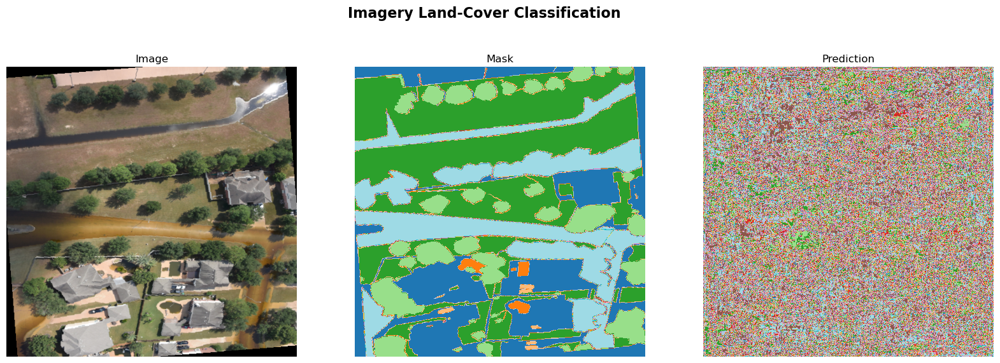

In [25]:
predict_and_plot(unet, train_dataset)

Classes in the mask:
Class 0: Background Percentage: 16.48%
Class 1: Property Roof Percentage: 14.87%
Class 2: Secondary Structure Percentage: 0.10%
Class 3: Swimming Pool Percentage: 1.32%
Class 4: Vehicle Percentage: 0.21%
Class 5: Grass Percentage: 18.30%
Class 6: Trees / Shrubs Percentage: 22.38%
Class 8: Chimney Percentage: 0.07%
Class 9: Street Light Percentage: 0.06%
Class 10: Window Percentage: 0.02%
Class 13: Trampoline Percentage: 0.07%
Class 23: Flooded Percentage: 26.12%


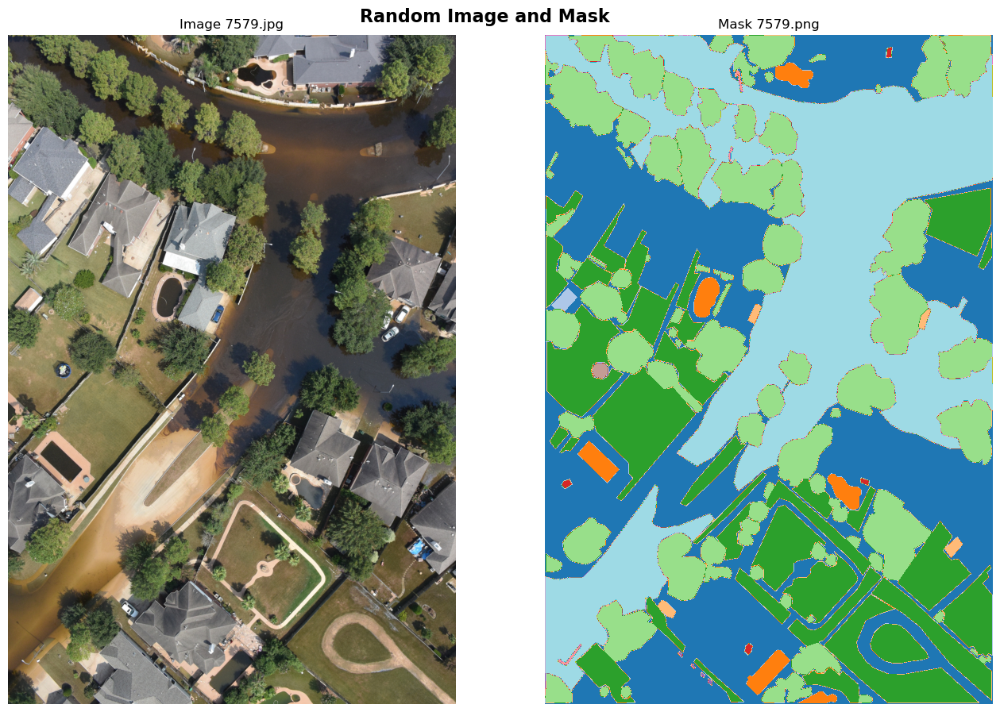

In [13]:
random_image_and_mask('data/train/train_images', 'data/train/train_masks')

In [57]:
def training_loop(model, loss_fn, optimizer, lr, batch_size, epochs, train_dataloader, test_dataloader, model_name, save):
    # Set initial bins
    train_loss = []
    test_loss = []
    train_accuracy_pw = []
    test_accuracy_pw = []
    train_iou = []
    train_classwise_iou = []
    test_iou = []
    test_classwise_iou = []

    for epoch in range(epochs):
        epoch += 1
        loop = tqdm(train_dataloader, total=len(train_dataloader), colour='blue')
        model.train()
        for batch, (X_train, y_train) in enumerate(loop):
            optimizer.zero_grad()
            X_train, y_train = X_train.cuda(), y_train.cuda()
            y_pred = model(X_train.float())
            loss = loss_fn(y_pred, y_train.squeeze(0).long())
            accuracy = pixel_wise_accuracy(y_pred, y_train)
            iou, classwise_iou = multiclass_iou(y_pred, y_train)
            train_loss.append(round(loss.item(),5))
            train_accuracy_pw.append(round(accuracy.item(),5))
            train_iou.append(round(iou,5))
            train_classwise_iou.append(classwise_iou)
            loss.backward()
            optimizer.step()
            loop.set_description("Epoch: {} | Batch: {} | Loss: {} | Accuracy: {} | IoU: {}".format(epoch, batch, round(loss.item(),5), round(accuracy.item(),5), round(iou,5)))
            loop.update(1)
        if save and epoch % 5 == 0:
            if not os.path.exists('models'):
                os.mkdir('models')
            torch.save(model.state_dict(), f'models/{model_name}_{epoch}.pth')
    loop.close()
    return train_loss, train_accuracy_pw, train_iou, model

In [ ]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(unet.parameters(), lr=1e-4)
train_loss, train_accuracy_pw, train_iou, model = training_loop(unet, loss_fn, optimizer, 1e-4, 1, 5, train_dataloader, test_dataloader, 'unet', True)

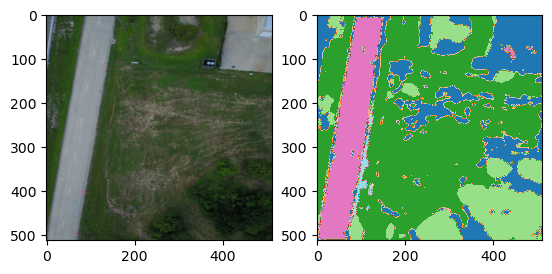

Class 0 has 46339 pixels which is 0.177 of the image, the class name is Background
Class 1 has 11520 pixels which is 0.044 of the image, the class name is Property Roof
Class 5 has 126804 pixels which is 0.484 of the image, the class name is Grass
Class 6 has 41875 pixels which is 0.16 of the image, the class name is Trees / Shrubs
Class 14 has 32700 pixels which is 0.125 of the image, the class name is Road/Highway
Class 21 has 314 pixels which is 0.001 of the image, the class name is Dense Vegetation / Forest
Class 22 has 1 pixels which is 0.0 of the image, the class name is Water Body
Class 23 has 2591 pixels which is 0.01 of the image, the class name is Flooded


In [32]:
random_image = np.random.choice(len(test_dataset), 1)[0]
image, mask = test_dataset[random_image]
image = image.unsqueeze(0).cuda()
pred = model(image.float())
pred = torch.argmax(pred, dim=1)
image = image.cpu()
image = image.squeeze(0)
image = image.permute(1,2,0)
image = image.numpy()
plt.subplot(121)
plt.imshow(image)
plt.subplot(122)
plt.imshow(pred.cpu().squeeze(0).numpy(), cmap='tab20')
plt.show()
pred=pred.cpu().squeeze(0).numpy()
classes = np.unique(pred)
total_pixels = pred.shape[0] * pred.shape[1]
for i in classes:
    pixels = np.sum(pred == i)
    print(f'Class {i} has {pixels} pixels which is {round(pixels/total_pixels, 3)} of the image, the class name is {class_map[str(i)]}')

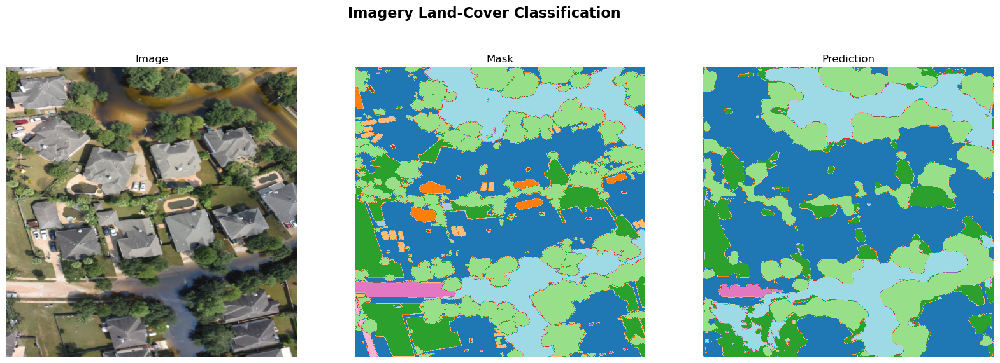

In [36]:
predict_and_plot(model, test_dataset)

In [39]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(unet.parameters(), lr=1e-5)
train_loss, train_accuracy_pw, train_iou, model = training_loop(unet, loss_fn, optimizer, 1e-5, 1, 5, train_dataloader, test_dataloader, 'unet_lre-5', True)

Epoch: 1 | Batch: 208 | Loss: 2.96728 | Accuracy: 74.21875 | IoU: 0.02347: 100%|██████████| 209/209 [01:29<00:00,  2.34it/s] 
Epoch: 2 | Batch: 208 | Loss: 2.90023 | Accuracy: 111.33203 | IoU: 0.03135: 100%|██████████| 209/209 [01:30<00:00,  2.32it/s]
Epoch: 3 | Batch: 208 | Loss: 2.46786 | Accuracy: 243.50977 | IoU: 0.06651: 100%|██████████| 209/209 [01:28<00:00,  2.35it/s]
Epoch: 4 | Batch: 208 | Loss: 2.20388 | Accuracy: 285.37109 | IoU: 0.07167: 100%|██████████| 209/209 [01:30<00:00,  2.32it/s]
Epoch: 5 | Batch: 208 | Loss: 2.04948 | Accuracy: 310.13086 | IoU: 0.08814: 100%|██████████| 209/209 [01:30<00:00,  2.31it/s]


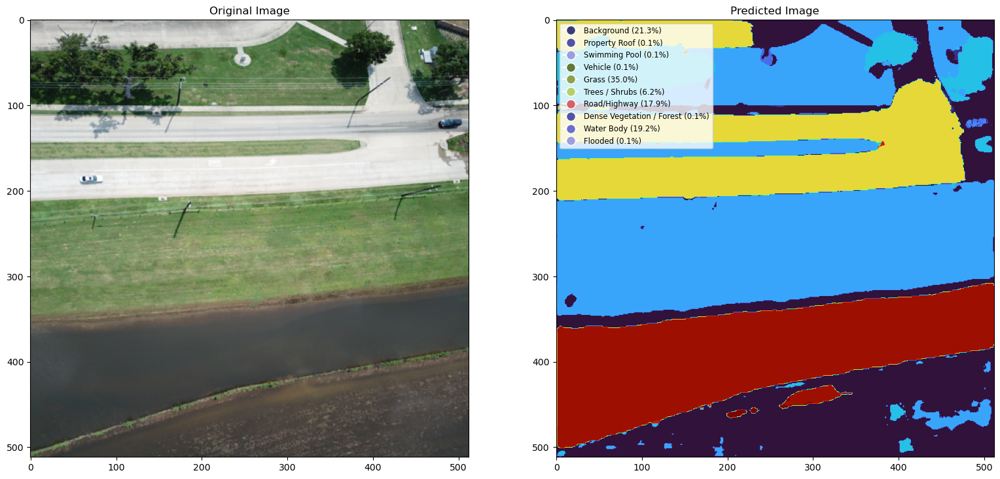

In [94]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# Assume `test_dataset` and `model` are defined earlier in your code

random_image = np.random.choice(len(test_dataset), 1)[0]
image, mask = test_dataset[random_image]
image = image.unsqueeze(0).cuda()
pred = model(image.float())
pred = torch.argmax(pred, dim=1)
image = image.cpu().squeeze(0).permute(1, 2, 0).numpy()
pred = pred.cpu().squeeze(0).numpy()

plt.figure(figsize=(19, 16))
plt.subplot(121)
plt.imshow(image)
plt.title('Original Image')
plt.subplot(122)
plt.imshow(pred, cmap='turbo')
plt.title('Predicted Image')

# Define class map
class_map = {'0': 'Background', '1': 'Property Roof', '2': 'Secondary Structure', '3': 'Swimming Pool',
             '4': 'Vehicle', '5': 'Grass', '6': 'Trees / Shrubs', '7': 'Solar Panels', '8': 'Chimney',
             '9': 'Street Light', '10': 'Window', '11': 'Satellite Antenna', '12': 'Garbage Bins',
             '13': 'Trampoline', '14': 'Road/Highway', '15': 'Under Construction / In Progress Status',
             '16': 'Power Lines & Cables', '17': 'Water Tank / Oil Tank', '18': 'Parking Area - Commercial',
             '19': 'Sports Complex / Arena', '20': 'Industrial Site', '21': 'Dense Vegetation / Forest',
             '22': 'Water Body', '23': 'Flooded', '24': 'Boat'}

# Calculate pixel distribution for each class
classes = np.unique(pred)
total_pixels = pred.shape[0] * pred.shape[1]
class_pixels = [np.sum(pred == i) for i in classes]

# Get colors corresponding to each class
unique_colors = np.unique(pred)
colors = plt.cm.tab20b.colors

# Create legend
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f"{class_map[str(i)]} ({round((pixels/total_pixels)*100,1)}%)",
                          markerfacecolor=colors[i % len(colors)], markersize=10) for i, pixels in zip(classes, class_pixels)]
plt.legend(handles=legend_elements, loc='upper left', fontsize='small')

plt.show()


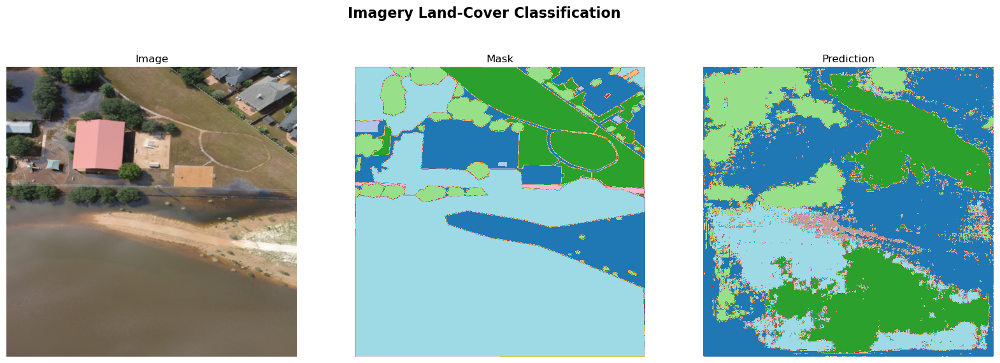

In [41]:
predict_and_plot(model, test_dataset)

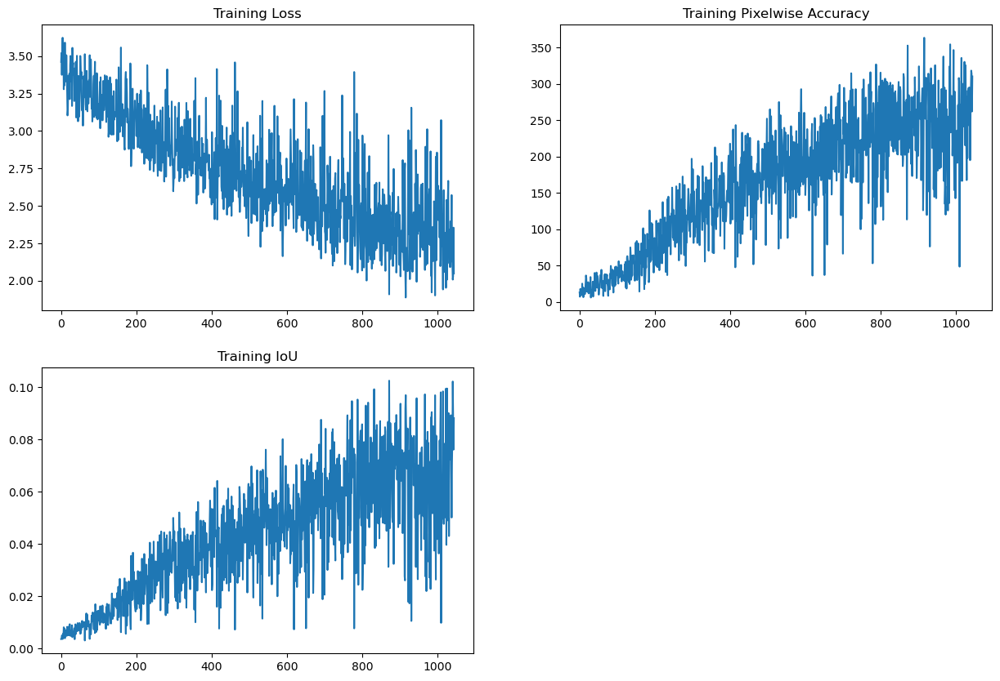

In [43]:
# plot metrics 
plt.figure(figsize=(15,10))
plt.subplot(221)
plt.plot(train_loss)
plt.title('Training Loss')
plt.subplot(222)
plt.plot(train_accuracy_pw)
plt.title('Training Pixelwise Accuracy')
plt.subplot(223)
plt.plot(train_iou)
plt.title('Training IoU')

plt.show()


In [44]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(unet.parameters(), lr=1e-5)
train_loss, train_accuracy_pw, train_iou, model = training_loop(unet, loss_fn, optimizer, 1e-5, 1, 20, train_dataloader, test_dataloader, 'unet_lre-5', True)

Epoch: 1 | Batch: 208 | Loss: 2.73501 | Accuracy: 144.51367 | IoU: 0.03759: 100%|██████████| 209/209 [01:26<00:00,  2.42it/s]
Epoch: 2 | Batch: 208 | Loss: 2.94187 | Accuracy: 85.02734 | IoU: 0.02337: 100%|██████████| 209/209 [01:25<00:00,  2.44it/s]]
Epoch: 3 | Batch: 208 | Loss: 2.44355 | Accuracy: 213.45117 | IoU: 0.06864: 100%|██████████| 209/209 [01:29<00:00,  2.34it/s]
Epoch: 4 | Batch: 208 | Loss: 2.53281 | Accuracy: 200.47266 | IoU: 0.05801: 100%|██████████| 209/209 [01:31<00:00,  2.29it/s]
Epoch: 5 | Batch: 208 | Loss: 2.46077 | Accuracy: 216.38672 | IoU: 0.0707: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]]
Epoch: 6 | Batch: 208 | Loss: 2.05681 | Accuracy: 283.74023 | IoU: 0.07018: 100%|██████████| 209/209 [01:28<00:00,  2.37it/s]
Epoch: 7 | Batch: 208 | Loss: 2.02664 | Accuracy: 298.53516 | IoU: 0.08085: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]
Epoch: 8 | Batch: 208 | Loss: 1.94102 | Accuracy: 302.99414 | IoU: 0.07934: 100%|██████████| 209/209 [01:29<00:00,  2.

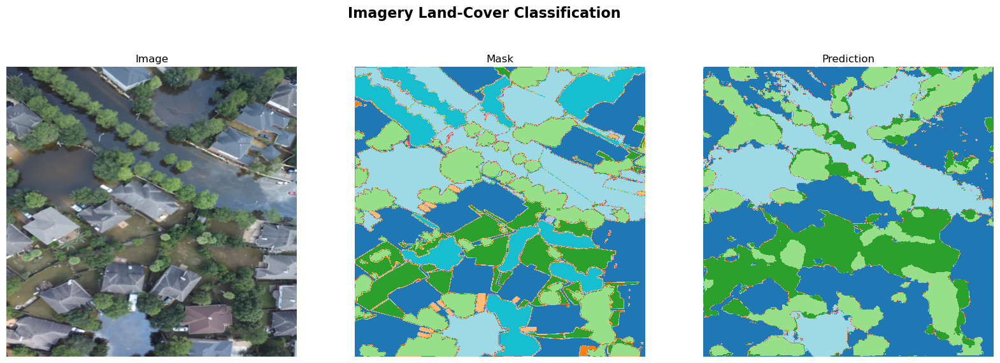

In [46]:
predict_and_plot(model, test_dataset)

In [48]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(unet.parameters(), lr=1e-4)
train_loss, train_accuracy_pw, train_iou, model = training_loop(unet, loss_fn, optimizer, 1e-4, 1, 20, train_dataloader, test_dataloader, 'unet_lr1e-4', True)

Epoch: 1 | Batch: 208 | Loss: 2.19845 | Accuracy: 253.01953 | IoU: 0.06922: 100%|██████████| 209/209 [01:25<00:00,  2.45it/s]
Epoch: 2 | Batch: 208 | Loss: 1.62723 | Accuracy: 296.29883 | IoU: 0.09148: 100%|██████████| 209/209 [01:26<00:00,  2.41it/s]
Epoch: 3 | Batch: 208 | Loss: 1.17289 | Accuracy: 348.68359 | IoU: 0.08299: 100%|██████████| 209/209 [01:27<00:00,  2.39it/s]
Epoch: 4 | Batch: 208 | Loss: 1.41766 | Accuracy: 321.6875 | IoU: 0.09469: 100%|██████████| 209/209 [01:27<00:00,  2.38it/s] 
Epoch: 5 | Batch: 208 | Loss: 1.5085 | Accuracy: 274.28711 | IoU: 0.09081: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]]
Epoch: 6 | Batch: 208 | Loss: 1.4296 | Accuracy: 327.5957 | IoU: 0.0807: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]/s]
Epoch: 7 | Batch: 208 | Loss: 1.13085 | Accuracy: 356.16992 | IoU: 0.11722: 100%|██████████| 209/209 [01:27<00:00,  2.39it/s]
Epoch: 8 | Batch: 208 | Loss: 1.13007 | Accuracy: 357.9375 | IoU: 0.12549: 100%|██████████| 209/209 [01:28<00:00,  2.3

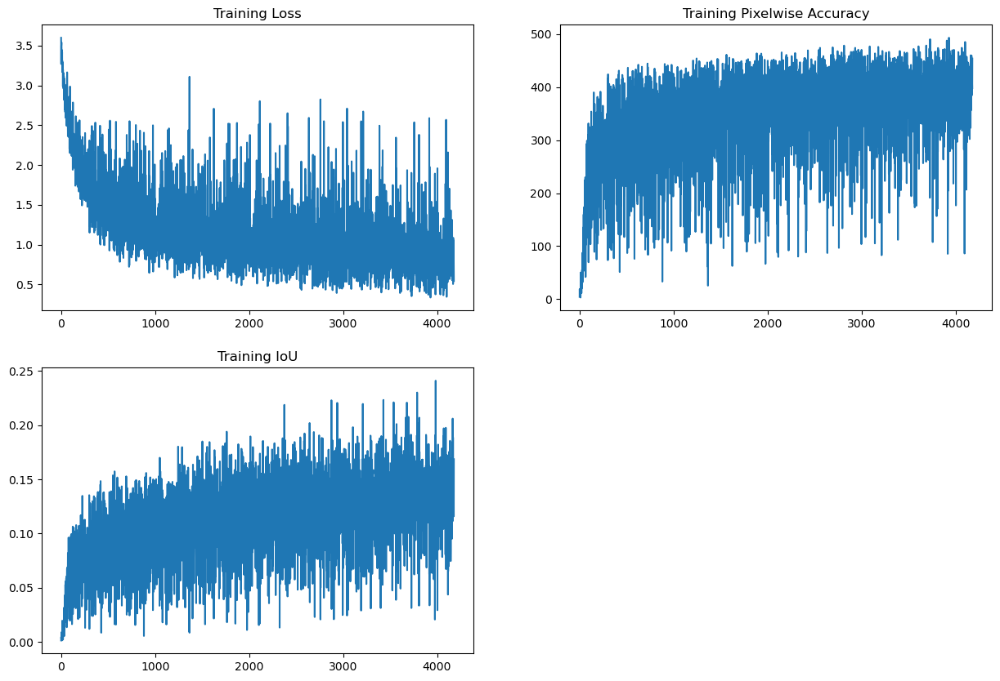

In [49]:
# plot metrics 
plt.figure(figsize=(15,10))
plt.subplot(221)
plt.plot(train_loss)
plt.title('Training Loss')
plt.subplot(222)
plt.plot(train_accuracy_pw)
plt.title('Training Pixelwise Accuracy')
plt.subplot(223)
plt.plot(train_iou)
plt.title('Training IoU')

plt.show()


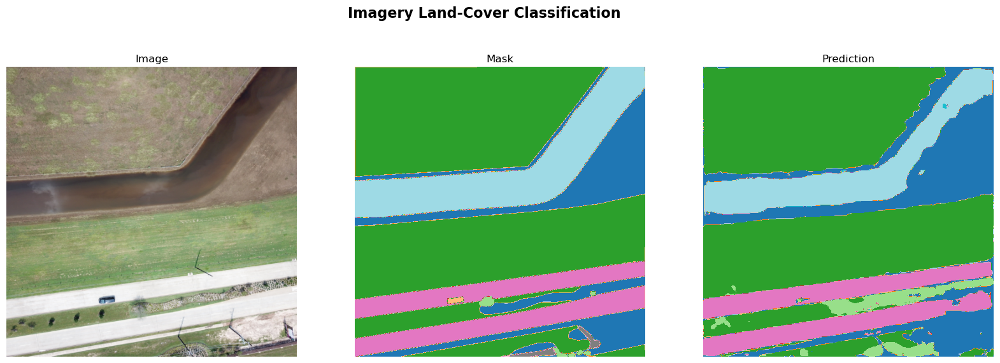

In [51]:
predict_and_plot(model, test_dataset)

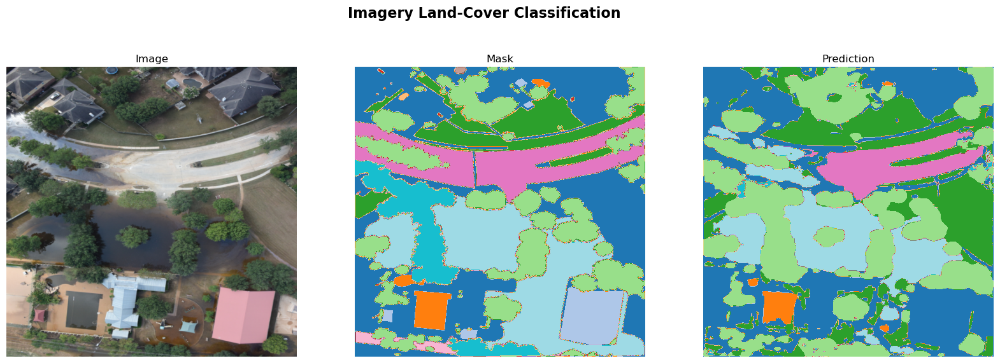

In [56]:
predict_and_plot(model, test_dataset)

In [58]:
unet = smp.Unet('resnet34', encoder_weights='imagenet', classes=25).cuda()
loss_fn = nn.CrossEntropyLoss()
optimizer = Adam(unet.parameters(), lr=1e-4)
train_loss, train_accuracy_pw, train_iou, model = training_loop(unet, loss_fn, optimizer, 1e-4, 1, 50, train_dataloader, test_dataloader, 'unet_lr1e-4', True)

Epoch: 1 | Batch: 208 | Loss: 1.45095 | Accuracy: 313.46484 | IoU: 0.07898: 100%|██████████| 209/209 [01:25<00:00,  2.44it/s]
Epoch: 2 | Batch: 208 | Loss: 1.16747 | Accuracy: 410.47461 | IoU: 0.11781: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]
Epoch: 3 | Batch: 208 | Loss: 1.28399 | Accuracy: 353.5 | IoU: 0.1108: 100%|██████████| 209/209 [01:26<00:00,  2.41it/s]it/s]
Epoch: 4 | Batch: 208 | Loss: 1.43312 | Accuracy: 255.9375 | IoU: 0.06323: 100%|██████████| 209/209 [01:27<00:00,  2.39it/s]]
Epoch: 5 | Batch: 208 | Loss: 1.03591 | Accuracy: 400.64258 | IoU: 0.12841: 100%|██████████| 209/209 [01:27<00:00,  2.39it/s]
Epoch: 6 | Batch: 208 | Loss: 1.54616 | Accuracy: 235.31836 | IoU: 0.06408: 100%|██████████| 209/209 [01:27<00:00,  2.40it/s]
Epoch: 7 | Batch: 208 | Loss: 0.77122 | Accuracy: 392.63672 | IoU: 0.11172: 100%|██████████| 209/209 [01:28<00:00,  2.37it/s]
Epoch: 8 | Batch: 208 | Loss: 0.86359 | Accuracy: 419.17383 | IoU: 0.14248: 100%|██████████| 209/209 [01:27<00:00,  2.

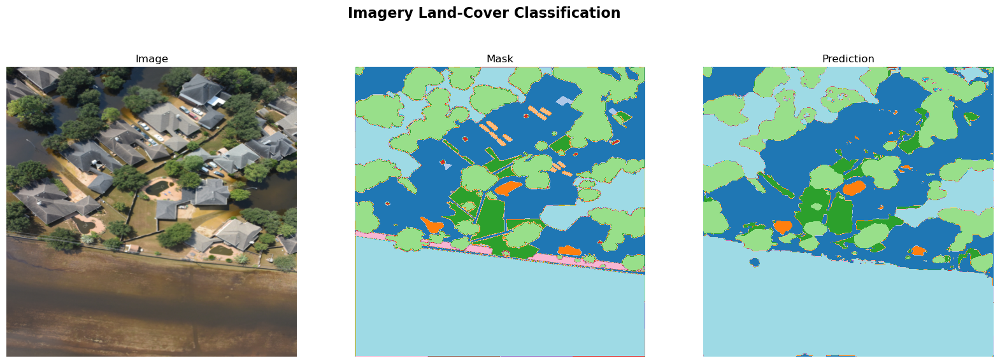

In [60]:
predict_and_plot(model, test_dataset) 

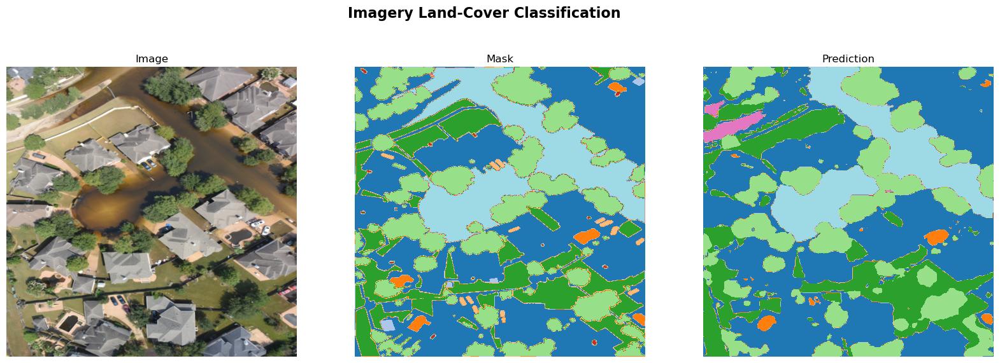

In [62]:
predict_and_plot(model, test_dataset)